In [27]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_excel('ballot_measure_poll.xlsx')
df.head(5)

,voter_id,support_initiative,region,county,education,ses,ethnicity,ideology,kids,pro_authoritarianism_score,...,pro_regulation_score,traditionalist_score,compassionate_score,pro_free_trade_score,pro_globalism_score,pro_healthcare_women_score,pro_populism_score,presidential_election_turnout_score,racial_resentment_score,pro_religious_freedom_score
0,0,yes,west,duchess,college_graduate,mid_ses,race_A,moderate,yes,69.0,...,54.0,38.0,66.0,42.0,49.0,71.0,31.0,15.0,55.0,36.0
1,1,yes,west,duchess,college_graduate,low_ses,race_A,liberal,no,65.0,...,51.0,35.0,66.0,49.0,54.0,61.0,38.0,NaN,49.0,41.0
2,2,yes,east,llandilo,college_graduate,wealthy,race_B,liberal,yes,73.0,...,60.0,52.0,50.0,48.0,49.0,51.0,37.0,13.0,67.0,57.0
3,3,no,east,cuya,college_graduate,wealthy,race_A,conservative,yes,77.0,...,56.0,49.0,43.0,46.0,40.0,41.0,30.0,71.0,77.0,52.0
4,4,no,east,cuya,college_graduate,very_wealthy,race_A,conservative,yes,76.0,...,51.0,47.0,50.0,40.0,42.0,43.0,37.0,76.0,75.0,55.0


In [26]:
# FOR QUICKER BASIC EDA ANALYSIS USING PANDAS BUILT IN

# ballot_profile = ProfileReport(df,title="Ballot_Measure_Poll Report")
# ballot_profile.to_notebook_iframe()
# ballot_profile.to_file('Ballot_Measure_poll.html')

In [5]:
#Shape of the datasedt
df.shape

(1099, 29)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1099 entries, 0 to 1098
Data columns (total 29 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   voter_id                             1099 non-null   int64  
 1   support_initiative                   1099 non-null   object 
 2   region                               1099 non-null   object 
 3   county                               1099 non-null   object 
 4   education                            1099 non-null   object 
 5   ses                                  1099 non-null   object 
 6   ethnicity                            1099 non-null   object 
 7   ideology                             1099 non-null   object 
 8   kids                                 1099 non-null   object 
 9   pro_authoritarianism_score           1046 non-null   float64
 10  pro_taxes_score                      1046 non-null   float64
 11  pro_gunrights_score           

In [7]:
# Describe the data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
voter_id,1099.0,549.000000,317.398278,0.0,274.5,549.0,823.50,1098.0
pro_authoritarianism_score,1046.0,74.241874,5.683840,32.0,70.0,74.0,79.00,85.0
pro_taxes_score,1046.0,39.130975,7.139690,21.0,34.0,38.0,45.00,84.0
pro_gunrights_score,1046.0,45.431166,12.253329,16.0,37.0,45.0,54.00,75.0
pro_healthcare_score,1046.0,38.009560,12.000953,18.0,28.0,36.0,46.00,69.0
pro_immigrants_score,1046.0,37.637667,13.019591,19.0,27.0,35.0,45.00,87.0
pro_supporting_the_poor_score,1046.0,39.477055,9.721527,19.0,32.0,39.0,47.75,85.0
environmentalist_score,1042.0,53.097889,2.145526,48.0,52.0,53.0,55.00,59.0
trust_in_institutions_score,1046.0,46.016252,0.337063,44.0,46.0,46.0,46.00,53.0
economic_populist_score,1046.0,34.670172,11.490925,13.0,25.0,34.0,44.00,77.0


<AxesSubplot:title={'center':'Correlation Matrix'}>

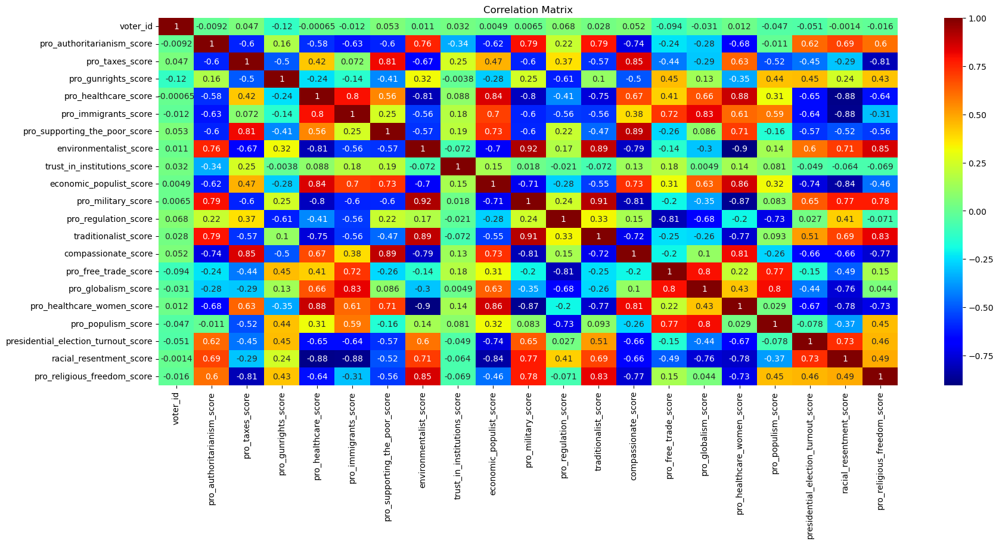

In [8]:
# Correlation matrix
correlation = df.corr()
plt.figure(figsize=(20,8))
plt.title('Correlation Matrix')
sns.heatmap(correlation, vmax=1, annot=True, cmap='jet')

<Figure size 1200x800 with 0 Axes>

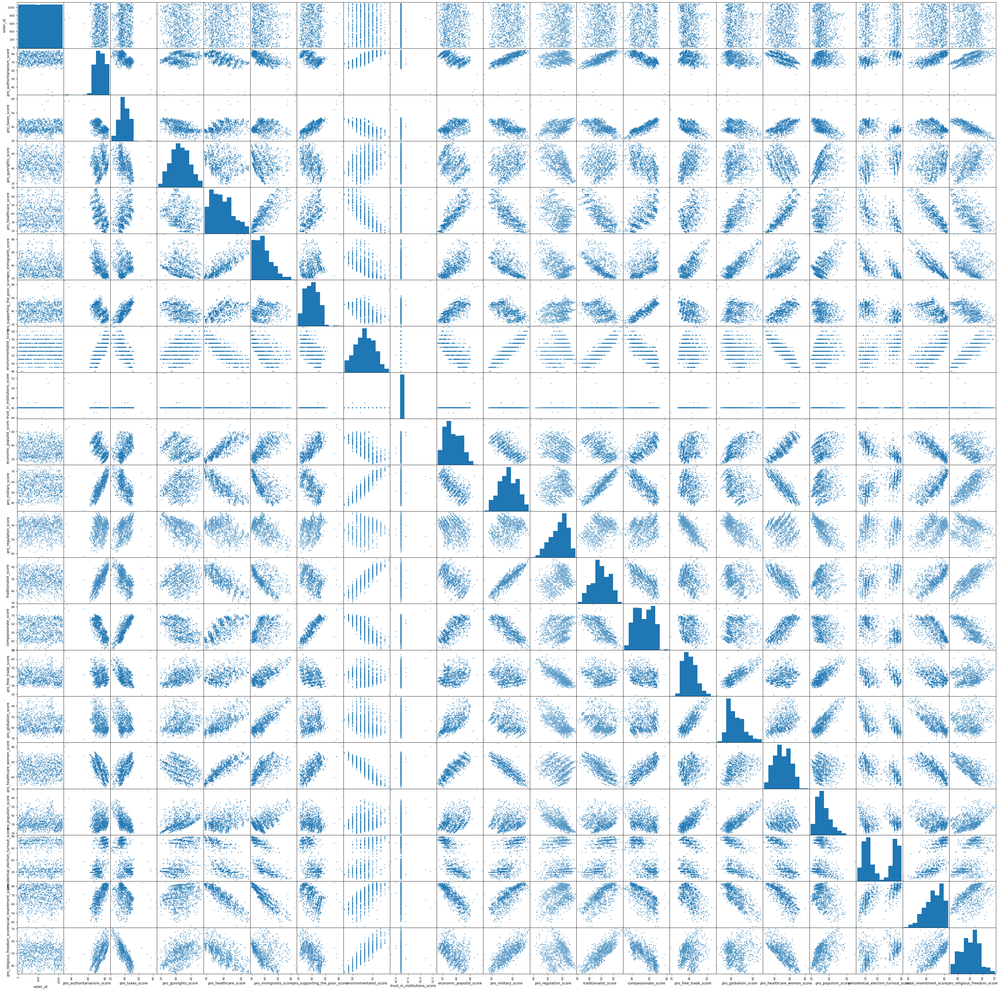

In [9]:
# Create a scatter matrix
plt.figure(figsize=(12,8))
scatter_matrix(df, figsize=(50,50))
plt.show()

That's a lot of scatter plot to look through, let's perform the K-Means clustering algorithm once again, since it will save us a bit of time rather than looking at 2 features at a time. The key take away from this is that majority of these scores show obvious signs of linear correlation.

In [10]:
# drop unique identifier and NaN
df = df.drop(['voter_id'],axis=1)
df = df.dropna()

In [12]:
# Check for null values
df.isnull().sum()/len(df)

support_initiative                     0.0
region                                 0.0
county                                 0.0
education                              0.0
ses                                    0.0
ethnicity                              0.0
ideology                               0.0
kids                                   0.0
pro_authoritarianism_score             0.0
pro_taxes_score                        0.0
pro_gunrights_score                    0.0
pro_healthcare_score                   0.0
pro_immigrants_score                   0.0
pro_supporting_the_poor_score          0.0
environmentalist_score                 0.0
trust_in_institutions_score            0.0
economic_populist_score                0.0
pro_military_score                     0.0
pro_regulation_score                   0.0
traditionalist_score                   0.0
compassionate_score                    0.0
pro_free_trade_score                   0.0
pro_globalism_score                    0.0
pro_healthc

In [14]:
# Many df we can look into...
# county_df = df.groupby('county').aggregate('mean')
# ethnicity_df = df.groupby('ethnicity').aggregate('mean')
# ideology_df = df.groupby('ideology').aggregate('mean')
support_init_df = df.groupby('support_initiative').aggregate('mean')

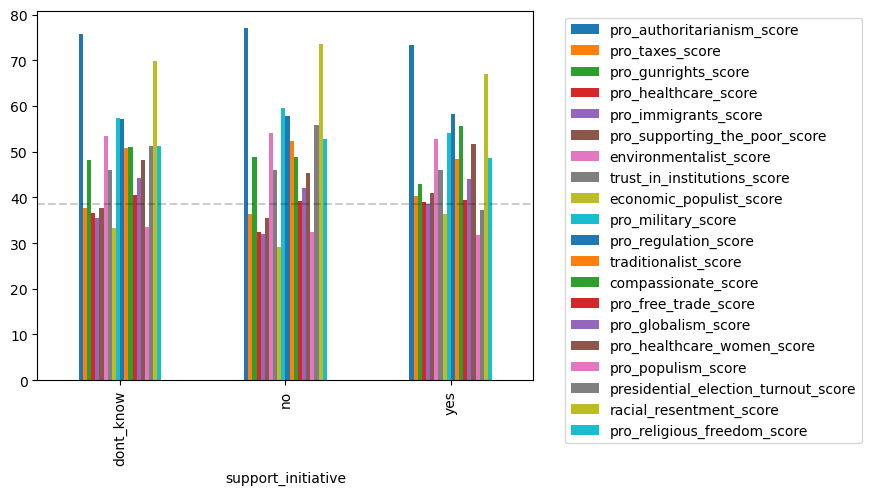

In [15]:
support_init_df.plot.bar()
plt.legend(bbox_to_anchor=(1.05, 1))
y_max = support_init_df.max().max()
plt.axhline(y_max/2, color='k', linestyle='--', label='Separating Region', alpha=0.2)

In [16]:
# Creating dataframe for clustering algorithm
df1 = df.drop(['support_initiative','region','county','education','ses','ethnicity','ideology','kids'],axis=1)

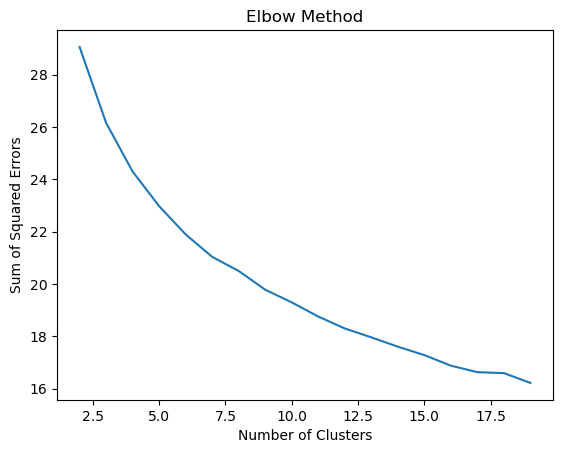

In [18]:
from scipy.cluster.vq import kmeans, vq

''' Choosing the number of Clusters'''
#create empty list for SSEs
sse_list = []

#calculate Sum of Squared Errors (SSE) for different numbers of clusters 
for k in range(2, 20):
    kmeans_instance = kmeans(df1, k)
    sse_list.append(kmeans_instance[1])

#plot SSEs
plt.plot(range(2, 20), sse_list)
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Errors')
plt.title('Elbow Method')
plt.show()

We'll choose 8 clusters from the Elbow method

In [19]:
# Create kmeans instance 
kmeans_instance = kmeans(df1, 7)
#Generate cluster labels for each point 
cluster_labels, _ = vq(df1, kmeans_instance[0])

#Coordinates of cluster centers 
cluster_centers = kmeans_instance[0]

# # of datapoints that lie in each cluster around their respectiv mean
cluster_counts = np.bincount(cluster_labels)

#print cluster labels and cluster centers 
# print(cluster_labels)
# print(cluster_centers)

In [21]:
df2 = df1.copy()
df2['cluster_labels'] = cluster_labels

#calculate mean values of each demographic feature for each cluster 
cluster_means = df2.groupby('cluster_labels').mean()

#print mean values for each cluster 
# print(cluster_means)

cluster_means_df = pd.DataFrame(cluster_means)
cluster_means_df

,pro_authoritarianism_score,pro_taxes_score,pro_gunrights_score,pro_healthcare_score,pro_immigrants_score,pro_supporting_the_poor_score,environmentalist_score,trust_in_institutions_score,economic_populist_score,pro_military_score,pro_regulation_score,traditionalist_score,compassionate_score,pro_free_trade_score,pro_globalism_score,pro_healthcare_women_score,pro_populism_score,presidential_election_turnout_score,racial_resentment_score,pro_religious_freedom_score
cluster_labels,,,,,,,,,,,,,,,,,,,,
0,71.553846,46.748718,32.646154,40.820513,36.066667,49.251282,51.902564,46.000000,40.051282,50.969231,62.835897,46.630769,63.825641,33.753846,40.594872,56.343590,26.246154,23.512821,65.815385,44.169231
1,67.968750,44.789062,44.742188,55.203125,51.062500,46.781250,50.023438,46.015625,48.625000,43.234375,53.515625,39.203125,64.148438,44.312500,50.101562,64.046875,33.468750,19.890625,54.796875,40.843750
2,72.561224,33.500000,41.612245,43.244898,54.397959,39.326531,53.275510,46.000000,45.040816,55.459184,54.663265,51.846939,52.153061,47.428571,55.061224,52.469388,42.326531,17.102041,59.551020,55.193878
3,74.151515,39.646465,45.363636,29.585859,30.424242,37.555556,53.797980,46.000000,29.363636,57.696970,60.030303,51.090909,52.656566,36.010101,39.070707,44.949495,29.222222,29.727273,73.979798,51.151515
4,79.335135,33.329730,55.405405,23.848649,25.448649,30.745946,55.621622,46.000000,22.162162,65.540541,58.345946,56.416216,42.513514,38.767568,39.329730,37.145946,32.383784,72.086486,79.270270,56.935135
5,79.073529,37.897059,41.029412,30.338235,27.029412,35.845588,54.286765,45.992647,24.742647,61.308824,61.389706,54.044118,49.022059,34.522059,38.264706,44.066176,28.330882,69.889706,76.941176,51.764706
6,76.018182,34.027273,57.390909,40.054545,39.954545,32.000000,52.972727,46.000000,32.290909,55.518182,50.890909,48.063636,47.327273,46.863636,48.036364,50.318182,37.718182,61.445455,68.736364,51.554545


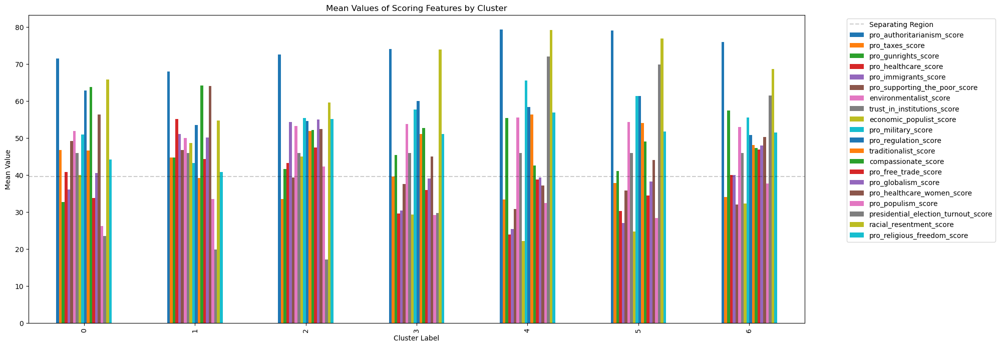

In [24]:
# Plotting the kmeans result
cluster_means_df.plot.bar(figsize=(20, 8))
plt.title('Mean Values of Scoring Features by Cluster')
plt.xlabel('Cluster Label')
plt.ylabel('Mean Value')

# Adding horizontal line for y_max/2
y_max = cluster_means_df.max().max()
plt.axhline(y_max/2, color='k', linestyle='--', label='Separating Region', alpha=0.2)

# Add legend
plt.legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.05, 1))

# show graph
plt.show()

# QUESTIONS

COMBINED <br>
1) Which score(s) would you recommend that the partners use for doing voter outreach so the ballot measure will be successful?
2) How should our partner use this score? 

It depends on multiple factors, for instance. We look at the mean of all the data groupby support initative:<br>
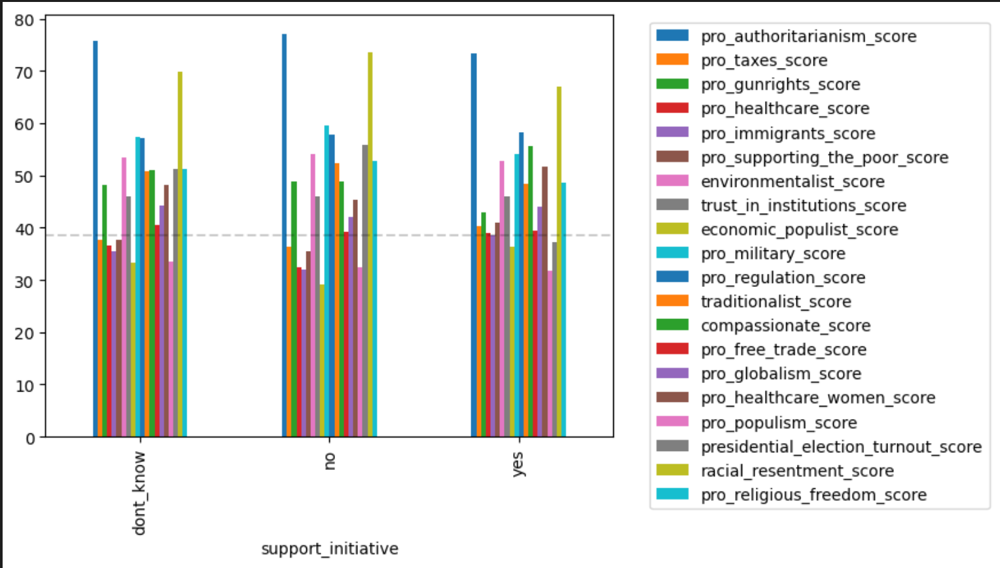 <br>

For the voters wh support the measure, we look at the 'yes' category and see that majority of their scoring metric fall in the average of a score of 39. Pro_authoritarianism, environmentalist_score, trust_in_institution_score, pro_military_score, traditionalist_score, pro_regulation_score, compassionate_score, pro_healthcare_women_score, racial_resentment_score, and pro_religious_freedom_score tend to fall above average within this category. And the reason why I say it depends, is that it's up to the voter outreach group to tailor around a specific group of voters, which we classified with the clustering algorithm that matches our correlation factor. So based on our ballot_measure_poll.csv, we found different groups of voters (based on the K-Means Clusters), where voters that share the same characteristics/views tend to form a cluster around that particular region.

i.e: If we want to tell the voter outreach group to reach out to voters who would assume to have less gunright_scores, you would have to correlate it with our correlation matrix and see either positive/negative correlation or no correlation. <br> 
In this scenario, pro_regulation_score is inversely correlated with pro_gunright_scores. Which means less pro_gunright_scores mean higher pro_regulation_score and the outreach group would have to base their surveys on that. And it's not just one correlation to look through, there are multiple factors that impacts pro_gunrights_score. Less gunrights_score means high support_tax_score, high healthcare_score, high support of poor, less environmentalist_score, high compassionate_score, less free_trade_score, high pro_health_women_score, less election_turnout_score, etc.<br>

<br>Note that Pearson Coefficient of -1 means strong negative correlation (If col A increases, then col B must be decreasing). A coefficient of 1 means strong positive correlation (If col A increases, then col B must be increasing). A coefficient of 0 means no correlation.

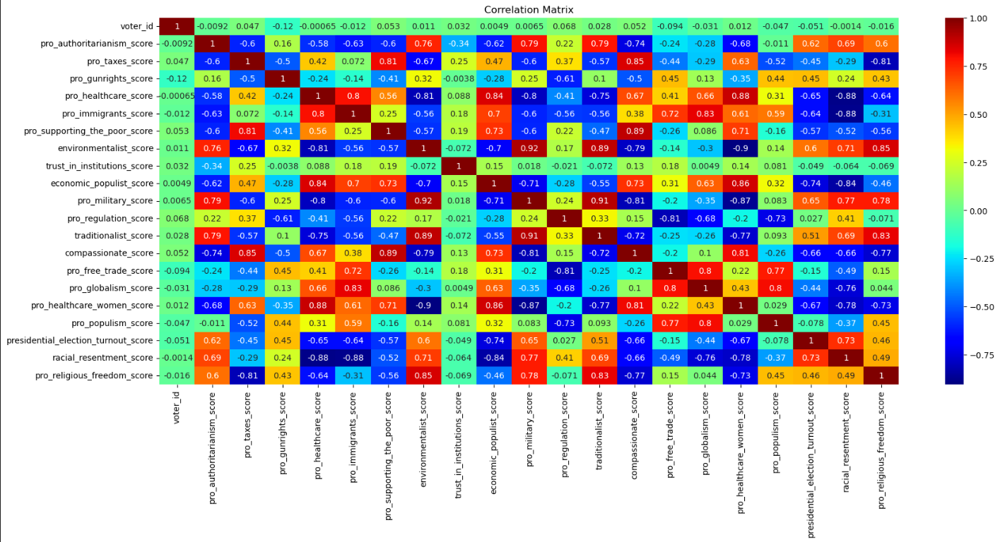

To verify this scenario, we take a look at the portfolios constructed from our K-Means Clustering Algorithm: <br>
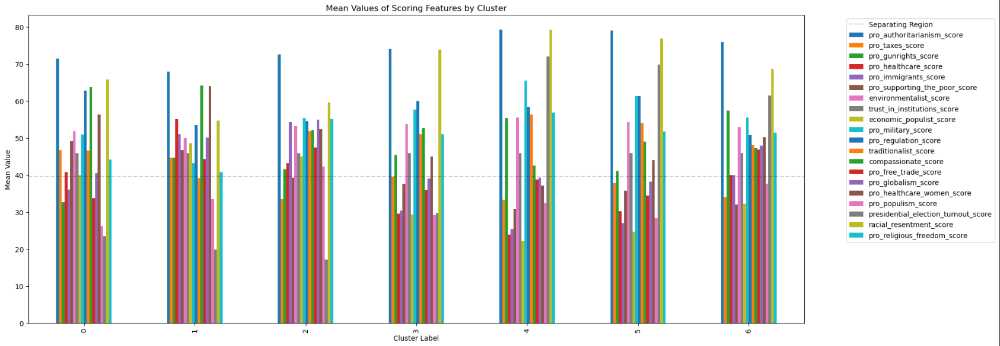

It seems that portfolio 0 seems to match that example scenario where there's less gunright_score and high regulation_score. We can see that there's high tax_score, high healthcare_score, high supporting_the_poor_score, high pro_military_score, high compassionate_score, low_free_trade_score, low presidential_election_turnout_score, etc. If we match it with our correlation matrix, then that particular voter would most likely end up in that category of cluster. And some of the data may not match COMPLETELY, but nonetheless they are more likely to be within Cluster 0. <br>
Another example could be whether we want to have a high presidential_election_turnout_score. If we follow the same method, we would find out that it is generally inversely correlated with healthcare_score and pro_taxes_score. We could use Portfolio 4,5,6 (Cluster 4,5,6) and voter outreach group would again, tailor around their efforts and identify what kind of voter they are dealing with so they can ensure the ballot measure is successful.

3) How would you convey the value of using the targeting strategy you recommend?  

If we identify which voter belongs in a particular cluster (0 - 6), it actually helps make it clearer on how to formulate the strategy when we have a baseline of voters with similar characteristics/viewpoints. Like in our first example, we said that our target audience is people who have less gunrights_score. Those people are more likely to support regulation policies. Another example is if we have high pro_healthcare_score, that voter must probably be within cluster 0 - 2, indicating that the voter is more like to support healthcare policy. If the outreach group speaks to each groups' needs and interests based on this correlation strategy and clustering technique, I'm sure that the ballot measure would be successful.

Text(0.5, 1.0, 'Turnout_score correlation')

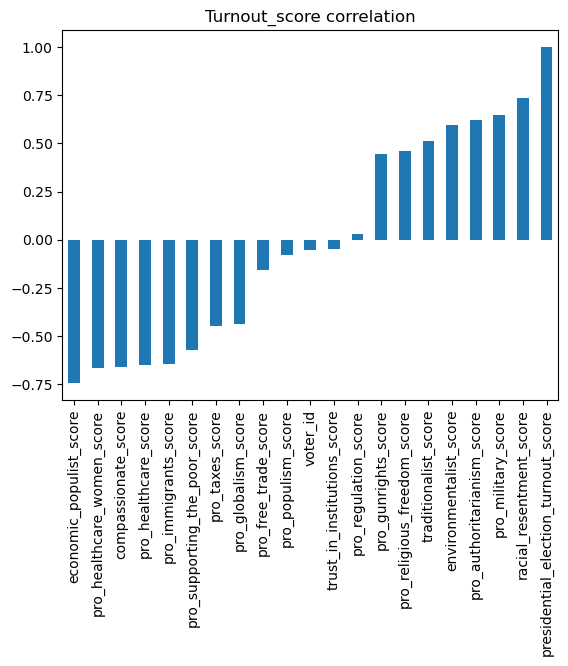

In [28]:
correlation['presidential_election_turnout_score'].sort_values().plot.bar()
plt.title('Turnout_score correlation')

i.e: presidential_election_turnout_score seems extremely important because it refers to the probability of people who choose to exercise their rights to vote, which is definitely an important factor in determining the outcome of elections. Let's say... we want this to be the important factor to consider, that means we would want a higher MEAN value of our clustering. Voter outreach would expect to mention factors that show some form of relationship with the turnout_score, so they can improve on increasing the amount of turnouts for future reference. Refer to cluster 4,5,6. Those are good portfolios to follow and voter outreach can base their surveys on those criteria, to ensure ballot measure is successful. Additionally (for this particular example). we can also create a regression analysis to predict the target variable (turnout_score) and see what the weights are for each predictor attributes, then use one of many ML models or deep learning models to find the regression metrics you specific and predict whether the voter (based on the predictor attribute) will have a high turnout score or not. 

It's important to note that correlation doesn't imply causation, but it can be an indication of a relationship between variables.